# Exploratory Data Analysis

## Setup

In [1]:
import pandas as pd
import numpy as np
import json
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns


/Users/vlad_ivanchuk/opt/anaconda3/envs/cs109a/lib/python3.9/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Data
I am using the [Image Composition Assessment DataBase (CADB)](https://github.com/bcmi/Image-Composition-Assessment-Dataset-CADB), which provides over 10,000 images with detailed composition category labels, annotations for the main subjects and leading lines, and human-assigned composition scores.

To limit the scope and complexity of the composition evaluation task, let's focus on one subset of the images – photos 
where the rule of thirds is the defining composition feature.

### Composition Elements

In [2]:
elements_df = pd.read_json('../data/CADB_Dataset/composition_elements.json', orient='index').reset_index().rename(columns={"index": "img"})
elements_df.head(10)

,img,vertical,rule_of_thirds,horizontal,golden_ratio,center,triangle,diagonal,curved,symmetric,pattern,vanishing_point,fill_the_frame,radial,none
0,9862.jpg,"[[366, 0, 456, 397], [112, 414, 104, 776], [56...","[[129, 543, 289, 847]]","[[100, 655, 514, 659]]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,9863.jpg,"[[287, 67, 285, 344], [640, 42, 639, 349], [95...",NaN,"[[82, 344, 1023, 369], [0, 148, 1023, 105], [1...","[[310, 254, 456, 523]]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,9866.jpg,"[[32, 0, 14, 614], [226, 562, 236, 403], [850,...",NaN,"[[15, 557, 171, 556], [761, 435, 850, 440], [1...",NaN,"[[210, 174, 827, 657]]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,9867.jpg,"[[521, 963, 423, 456]]",NaN,NaN,NaN,"[[88, 0, 600, 522]]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,9871.jpg,"[[182, 560, 194, 223], [44, 536, 36, 276], [58...",NaN,"[[182, 304, 512, 312], [0, 273, 139, 277]]",NaN,"[[382, 216, 554, 316]]","[[0, 612, 525, 463, 1023, 595], [0, 198, 508, ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,9877.jpg,"[[73, 680, 76, 292], [602, 265, 602, 477], [89...",NaN,"[[59, 271, 559, 263], [98, 326, 460, 318], [65...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,988.jpg,"[[534, 94, 544, 412], [415, 385, 408, 315], [6...",NaN,"[[1, 283, 407, 315], [181, 379, 480, 388], [0,...",NaN,NaN,NaN,"[[1023, 0, 0, 501]]",NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,9882.jpg,"[[226, 0, 227, 400], [149, 0, 150, 369], [889,...",NaN,"[[227, 255, 923, 215], [226, 302, 912, 267], [...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,9888.jpg,"[[158, 606, 142, 20], [208, 589, 195, 49], [45...",NaN,"[[389, 84, 645, 79], [390, 543, 629, 544], [71...","[[607, 197, 755, 633]]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,9890.jpg,"[[566, 67, 562, 346], [145, 13, 137, 239], [77...",NaN,"[[0, 236, 1023, 295], [380, 396, 241, 400]]",NaN,"[[0, 243, 1023, 677]]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [3]:
# Examine counts of photograph in each compositional attribute category
elements_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9497 entries, 0 to 9496
Data columns (total 15 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   img              9497 non-null   object
 1   vertical         1896 non-null   object
 2   rule_of_thirds   1291 non-null   object
 3   horizontal       3132 non-null   object
 4   golden_ratio     354 non-null    object
 5   center           4804 non-null   object
 6   triangle         598 non-null    object
 7   diagonal         2083 non-null   object
 8   curved           349 non-null    object
 9   symmetric        359 non-null    object
 10  pattern          106 non-null    object
 11  vanishing_point  280 non-null    object
 12  fill_the_frame   284 non-null    object
 13  radial           42 non-null     object
 14  none             18 non-null     object
dtypes: object(15)
memory usage: 1.1+ MB


In [4]:
# Filter to only photos where rule_of_thirds subject has been annotated with a bounding box
elements_rule_of_thirds_df = elements_df[~elements_df["rule_of_thirds"].isnull()]
elements_rule_of_thirds_df.head(10)

,img,vertical,rule_of_thirds,horizontal,golden_ratio,center,triangle,diagonal,curved,symmetric,pattern,vanishing_point,fill_the_frame,radial,none
0,9862.jpg,"[[366, 0, 456, 397], [112, 414, 104, 776], [56...","[[129, 543, 289, 847]]","[[100, 655, 514, 659]]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,9903.jpg,"[[486, 285, 518, 129], [794, 278, 768, 118]]","[[586, 196, 950, 682]]","[[481, 284, 798, 282], [0, 227, 487, 241], [10...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
13,991.jpg,"[[591, 0, 590, 336], [63, 60, 85, 351]]","[[580, 178, 828, 575]]","[[86, 185, 501, 185]]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15,9919.jpg,"[[714, 47, 701, 347], [118, 83, 117, 193], [34...","[[14, 203, 154, 509]]","[[0, 255, 1023, 265], [0, 358, 1023, 357], [89...","[[371, 189, 820, 663]]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
22,9940.jpg,"[[721, 360, 726, 0], [563, 375, 587, 1], [373,...","[[576, 343, 933, 520]]","[[1023, 381, 468, 375], [1023, 484, 320, 481],...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28,9984.jpg,"[[700, 0, 700, 348], [852, 0, 843, 205]]","[[150, 226, 548, 637]]","[[0, 646, 1023, 611], [253, 237, 1023, 200], [...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
36,9812.jpg,"[[450, 167, 450, 353], [251, 188, 254, 311]]","[[572, 329, 979, 610]]","[[100, 235, 654, 271], [1023, 179, 445, 220], ...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
40,9829.jpg,"[[922, 0, 834, 343], [1007, 0, 883, 483], [882...","[[588, 0, 1023, 506]]","[[1023, 386, 0, 389], [908, 375, 612, 359]]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
46,9860.jpg,"[[663, 0, 657, 498], [408, 427, 404, 157], [83...","[[193, 453, 332, 547]]","[[405, 164, 746, 159], [397, 227, 838, 225], [...",NaN,NaN,"[[397, 162, 631, 28, 809, 134]]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
49,9684.jpg,"[[57, 222, 67, 424], [332, 200, 336, 312], [85...","[[35, 178, 490, 535]]","[[65, 223, 333, 205], [861, 87, 0, 83]]",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
# Extract the column with bounding box subject annotations and verify that each image only has one box
print("Unique numbers of bounding boxes per image:")
print(np.unique([len(bbox) for bbox in elements_rule_of_thirds_df["rule_of_thirds"]]))

Unique numbers of bounding boxes per image:
[1]


In [6]:
print("Unique numbers of dimensions of bounding box coordinates:")
print(np.unique([len(bbox[0]) for bbox in elements_rule_of_thirds_df["rule_of_thirds"]]))

Unique numbers of dimensions of bounding box coordinates:
[4]


In [7]:
# Unpack rule_of_thirds subject bounding boxes coordinates into separate columns to use for feature engineering
elements_rule_of_thirds_df.loc[:, ["rule_of_thirds_x1", "rule_of_thirds_y1", "rule_of_thirds_x2", "rule_of_thirds_y2"]] = [bbox[0] for bbox in elements_rule_of_thirds_df["rule_of_thirds"]]
elements_rule_of_thirds_df.drop('rule_of_thirds', axis=1, inplace=True)

/Users/vlad_ivanchuk/opt/anaconda3/envs/cs109a/lib/python3.9/site-packages/pandas/core/indexing.py:1835: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value[:, i].tolist(), pi)
/Users/vlad_ivanchuk/opt/anaconda3/envs/cs109a/lib/python3.9/site-packages/pandas/core/frame.py:4901: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [8]:
# Save names of images in this subset
rule_of_thirds_imgs = elements_rule_of_thirds_df["img"].values

In [9]:
# Save preprocessed CSV
elements_rule_of_thirds_df.to_csv('../data/preprocessed/elements_df.csv', index=False)

### Scene Classification

In [10]:
# Converting the JSON data into a structured list for DataFrame
f = open('../data/CADB_Dataset/scene_categories.json')
scenes_json = json.load(f)

scenes_data = []
for img, scene_category in scenes_json.items():
    scenes_data.append({
        "img": img,
        "scene": scene_category
        })

# Creating a DataFrame
scenes_df = pd.DataFrame(scenes_data)


In [11]:
# Scene category counts for images from the rule_of_thirds composition element category
scenes_df.loc[scenes_df["img"].isin(rule_of_thirds_imgs), "scene"].value_counts()

human           805
static          112
animal           99
landscape        82
plant            75
cityscape        37
architecture     36
indoor           19
night            13
other            13
Name: scene, dtype: int64

In [12]:
# Save preprocessed CSV
scenes_df.loc[scenes_df["img"].isin(rule_of_thirds_imgs), ["img", "scene"]].to_csv('../data/preprocessed/scenes_df.csv', index=False)

### Composition Attributes

In [13]:
attributes_df = pd.read_json('../data/CADB_Dataset/composition_attributes.json', orient='index').reset_index().rename(columns={"index": "img"})
attributes_df.head(10)

,img,Light,Symmetry,Object,score,RuleOfThirds,Repetition,BalacingElements,ColorHarmony,MotionBlur,VividColor,DoF,Content
0,10003.jpg,0.4,0.0,-0.4,0.650,0.4,0.0,0.0,0.8,0.0,0.4,0.0,0.6
1,10007.jpg,0.2,0.0,0.4,0.500,0.0,0.0,0.0,0.2,-0.2,-0.2,-0.2,0.2
2,10008.jpg,0.0,0.2,0.2,0.400,-0.4,0.0,0.0,0.2,0.0,-0.4,0.2,0.4
3,1001.jpg,-0.2,0.0,0.8,0.438,-0.2,0.0,0.2,0.0,0.0,0.0,0.0,0.4
4,10010.jpg,0.2,0.0,-0.4,0.550,-0.4,0.2,0.0,0.4,0.0,0.4,0.2,1.0
5,10011.jpg,0.0,0.0,1.0,0.750,0.2,0.0,0.4,0.6,0.0,0.0,0.0,0.4
6,10012.jpg,0.2,0.0,0.0,0.550,0.0,0.0,-0.2,0.0,0.0,0.0,0.2,0.4
7,10015.jpg,-0.4,0.0,-0.2,0.300,-0.2,0.0,-0.2,-0.2,0.0,-0.4,0.0,1.0
8,10016.jpg,0.0,0.0,0.4,0.600,0.4,0.0,0.0,0.2,0.0,0.2,0.8,0.6
9,10017.jpg,-0.2,0.0,-0.4,0.400,-0.2,0.8,0.0,0.8,0.0,0.2,0.0,-0.6


In [14]:
# Filter to images in rule_of_thirds composition element category
attributes_df.loc[attributes_df["img"].isin(rule_of_thirds_imgs), :].describe()

,Light,Symmetry,Object,score,RuleOfThirds,Repetition,BalacingElements,ColorHarmony,MotionBlur,VividColor,DoF,Content
count,1291.000000,1291.000000,1291.000000,1291.000000,1291.000000,1291.000000,1291.000000,1291.000000,1291.000000,1291.000000,1291.000000,1291.000000
mean,-0.002182,0.005887,0.028225,0.515955,0.128658,0.037465,0.040576,0.242074,-0.008211,0.000910,0.061141,0.194553
std,0.346391,0.035386,0.505060,0.187525,0.258536,0.102056,0.220996,0.286599,0.108580,0.354238,0.303327,0.509709
min,-1.000000,0.000000,-1.000000,0.000000,-0.600000,0.000000,-0.800000,-0.400000,-1.000000,-1.000000,-1.000000,-1.000000
25%,-0.200000,0.000000,-0.400000,0.400000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.200000,0.000000,-0.200000
50%,0.000000,0.000000,0.000000,0.500000,0.167000,0.000000,0.000000,0.200000,0.000000,0.000000,0.000000,0.200000
75%,0.200000,0.000000,0.400000,0.650000,0.200000,0.000000,0.200000,0.400000,0.000000,0.200000,0.200000,0.600000
max,1.000000,0.400000,1.000000,1.000000,1.000000,0.800000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [15]:
attributes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9497 entries, 0 to 9496
Data columns (total 13 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   img               9497 non-null   object 
 1   Light             9497 non-null   float64
 2   Symmetry          9497 non-null   float64
 3   Object            9497 non-null   float64
 4   score             9497 non-null   float64
 5   RuleOfThirds      9497 non-null   float64
 6   Repetition        9497 non-null   float64
 7   BalacingElements  9497 non-null   float64
 8   ColorHarmony      9497 non-null   float64
 9   MotionBlur        9497 non-null   float64
 10  VividColor        9497 non-null   float64
 11  DoF               9497 non-null   float64
 12  Content           9497 non-null   float64
dtypes: float64(12), object(1)
memory usage: 964.7+ KB


In [16]:
# Rename the variables
attributes_df.rename(columns={
    'Light': 'exposure',
    'VividColor': 'color_vivid',
    'ColorHarmony': 'color_harmony',
    'Object': 'object_emphasis',
    'BalacingElements': 'balancing_elements',
    'Symmetry': 'symmetry',
    'Repetition': 'repetition',
    'RuleOfThirds': 'rule_of_thirds',
    'MotionBlur': 'motion_blur',
    'DoF': 'depth_of_field'
}, inplace=True)

# List of new variable names
variables = ['exposure', 'color_vivid', 'color_harmony', 'object_emphasis', 'balancing_elements', 
             'symmetry', 'repetition', 'rule_of_thirds', 'motion_blur', 'depth_of_field']

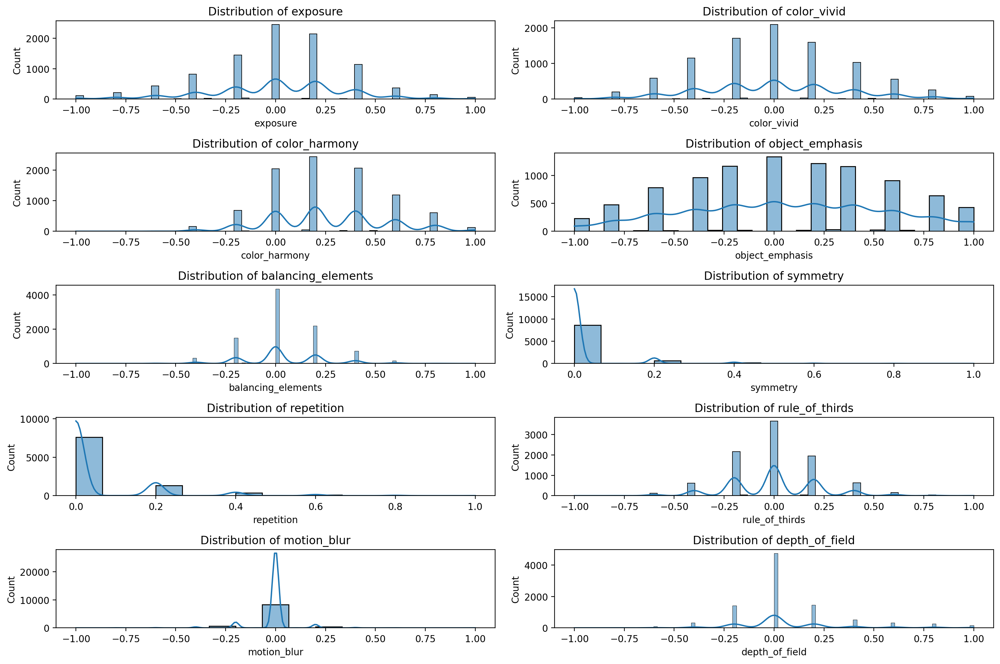

In [17]:
# Set up the matplotlib figure
plt.figure(figsize=(15, 10), dpi=200)

# Plot distributions
for i, variable in enumerate(variables, 1):
    plt.subplot(5, 2, i)  # 5 rows, 2 columns
    sns.histplot(attributes_df[variable], kde=True)
    plt.title(f'Distribution of {variable}')
plt.tight_layout()
plt.show()

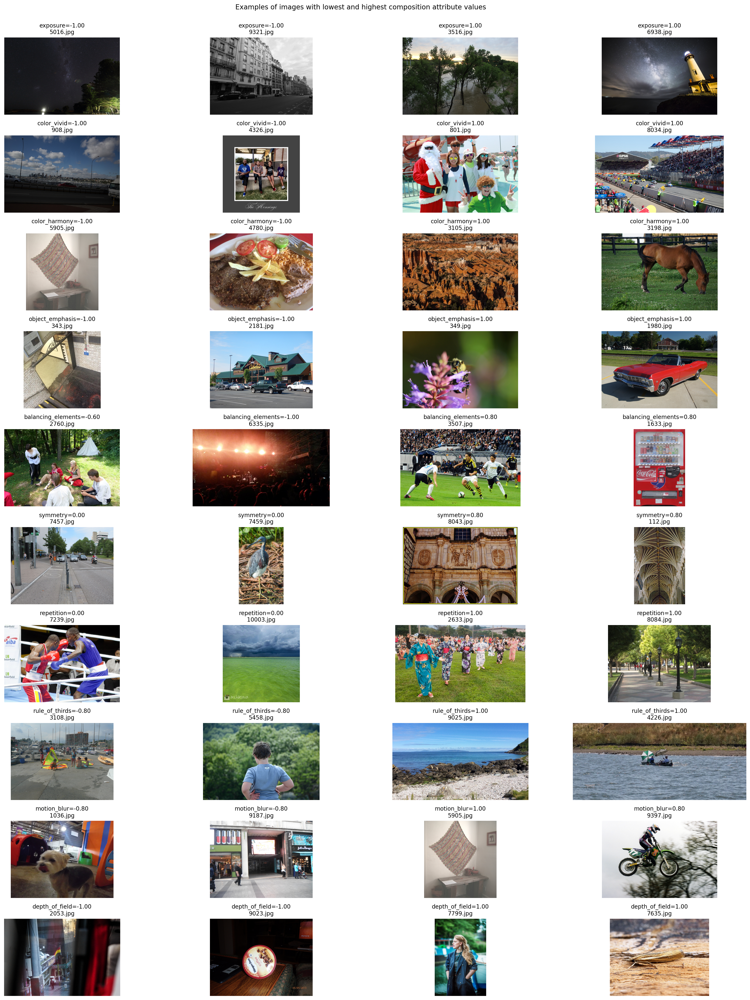

In [24]:
# Define the image directory
image_directory = '../data/CADB_Dataset/images/'

# Set up the matplotlib figure for image visualization
fig, axs = plt.subplots(len(variables), 4, figsize=(20, 2.5 * len(variables)), dpi=200)
fig.suptitle("Examples of images with lowest and highest composition attribute values")      

for i, variable in enumerate(variables):
    # Sort the DataFrame by the current variable
    sorted_df = attributes_df.sort_values(by=variable)
        
    # Get the paths and the values for the lowest and highest value images
    # Select the top 10 and bottom 10, then sample 2 from each
    low_samples = sorted_df.head(10).sample(2)
    high_samples = sorted_df.tail(10).sample(2)
    samples_to_display = pd.concat([low_samples, high_samples])

    for j, (img_filename, val) in enumerate(zip(samples_to_display['img'], samples_to_display[variable])):
        img_path = f"{image_directory}{img_filename}"
        img = Image.open(img_path)
        
        # Plotting the image
        ax = axs[i, j]
        ax.imshow(img)
        ax.axis('off')  # Hide the axis
        # Update title to include the value of the variable
        ax.set_title(f"{variable}={val:.2f}\n{img_filename}", fontsize=10)

plt.tight_layout(rect=[0, 0, 1, 0.98])
plt.savefig('../visualizations/qualitative_features.png')
plt.show()


In [19]:
# Save preprocessed CSV
attributes_df.loc[attributes_df["img"].isin(rule_of_thirds_imgs), :].to_csv('../data/preprocessed/attributes_df.csv', index=False)

### Composition Scores

In [20]:
scores_df = pd.read_json('../data/CADB_Dataset/composition_scores.json', orient='index').reset_index().rename(columns={"index": "img"})
scores_df.head(10)

,img,scores,dist,mean
0,10003.jpg,"[2.0, 3.0, 2.0, 2.0, 2.0]","[0.0, 0.8, 0.2, 0.0, 0.0]",2.2
1,10007.jpg,"[2.0, 2.0, 4.0, 2.0, 2.0]","[0.0, 0.8, 0.0, 0.2, 0.0]",2.4
2,10008.jpg,"[3.0, 1.0, 3.0, 3.0, 2.0]","[0.2, 0.2, 0.6000000000000001, 0.0, 0.0]",2.4
3,1001.jpg,"[2.0, 2.0, 3.0, 2.0, 2.0]","[0.0, 0.8, 0.2, 0.0, 0.0]",2.2
4,10010.jpg,"[3.0, 2.0, 2.0, 3.0, 2.0]","[0.0, 0.6000000000000001, 0.4, 0.0, 0.0]",2.4
5,10011.jpg,"[2.0, 2.0, 3.0, 2.0, 2.0]","[0.0, 0.8, 0.2, 0.0, 0.0]",2.2
6,10012.jpg,"[3.0, 2.0, 4.0, 3.0, 2.0]","[0.0, 0.4, 0.4, 0.2, 0.0]",2.8
7,10015.jpg,"[2.0, 2.0, 1.0, 2.0, 3.0]","[0.2, 0.6000000000000001, 0.2, 0.0, 0.0]",2.0
8,10016.jpg,"[3.0, 3.0, 4.0, 3.0, 3.0]","[0.0, 0.0, 0.8, 0.2, 0.0]",3.2
9,10017.jpg,"[2.0, 2.0, 2.0, 3.0, 2.0]","[0.0, 0.8, 0.2, 0.0, 0.0]",2.2


In [21]:
# Filter to images in rule_of_thirds composition element category
scores_df.loc[scores_df["img"].isin(rule_of_thirds_imgs), :].describe()

,mean
count,1291.000000
mean,2.780480
std,0.576321
min,1.200000
25%,2.400000
50%,2.800000
75%,3.200000
max,5.000000


In [22]:
# TODO: Visualize distribution of mean scores of images in the 'rule_of_thirds' category

In [23]:
# Save preprocessed CSV
scores_df.loc[scores_df["img"].isin(rule_of_thirds_imgs), ["img", "mean"]].to_csv('../data/preprocessed/scores_df.csv', index=False)